# Image alignment

In this task I worked on channel processing problem 

In [6]:
%pylab inline
import matplotlib.pyplot as plt 
import numpy as np

Populating the interactive namespace from numpy and matplotlib


In [7]:
import cv2,os

In [8]:
def load_data(dir_name = 'plates'):
    
    plates=[]
    for filename in os.listdir(dir_name):
        img = cv2.imread(os.path.join(dir_name,filename),0)
        if img is not None:
            plates.append(img)
    return plates

plates = load_data()

In [16]:
plates[0].shape

(1153, 448)

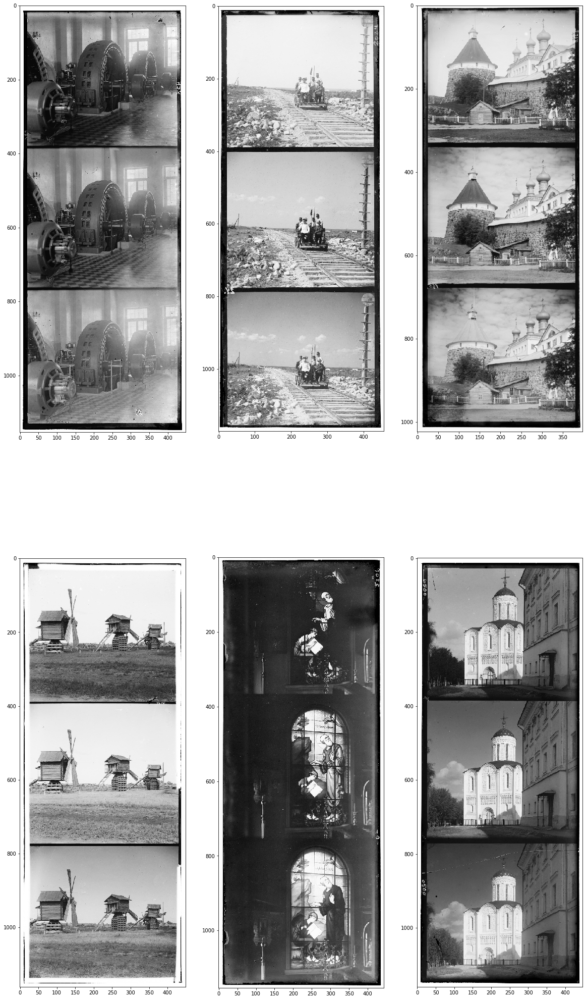

In [23]:
# The auxiliary function `visualize()` displays the images given as argument.
def visualize(imgs, format=None):
    plt.figure(figsize=(20, 37))
    for i, img in enumerate(imgs):
#         if img.shape[0] == 3:
#             img = img.transpose(1,2,0)
        plt_idx = i+1
        plt.subplot(2, 3, plt_idx)    
        plt.imshow(img, cmap=format)
    plt.show()

visualize(plates, 'gray')

#### The borders removal 
It is worth noting that there is a framing from all sides in most of the images. This framing can appreciably worsen the quality of channels alignment. Here, we suggest that you find the borders on the plates using Canny edge detector, and crop the images according to these edges. The example of using Canny detector implemented in skimage library can be found [here](http://scikit-image.org/docs/dev/auto_examples/edges/plot_canny.html).<br>

The borders can be removed in the following way:
* Apply Canny edge detector to the image.
* Find the rows and columns of the frame pixels. 
For example, in case of upper bound we will search for the row in the neighborhood of the upper edge of the image (e.g. 5% of its height). For each row let us count the number of edge pixels (obtained using Canny detector) it contains. Having these number let us find two maximums among them. Two rows corresponding to these maximums are edge rows. As there are two color changes in the frame (firstly, from light scanner background to the dark tape and then from the tape to the image), we need the second maximum that is further from the image border. The row corresponding to this maximum is the crop border. In order not to find two neighboring peaks, non-maximum suppression should be implemented: the rows next to the first maximum are set to zero, and after that, the second maximum is searched for.

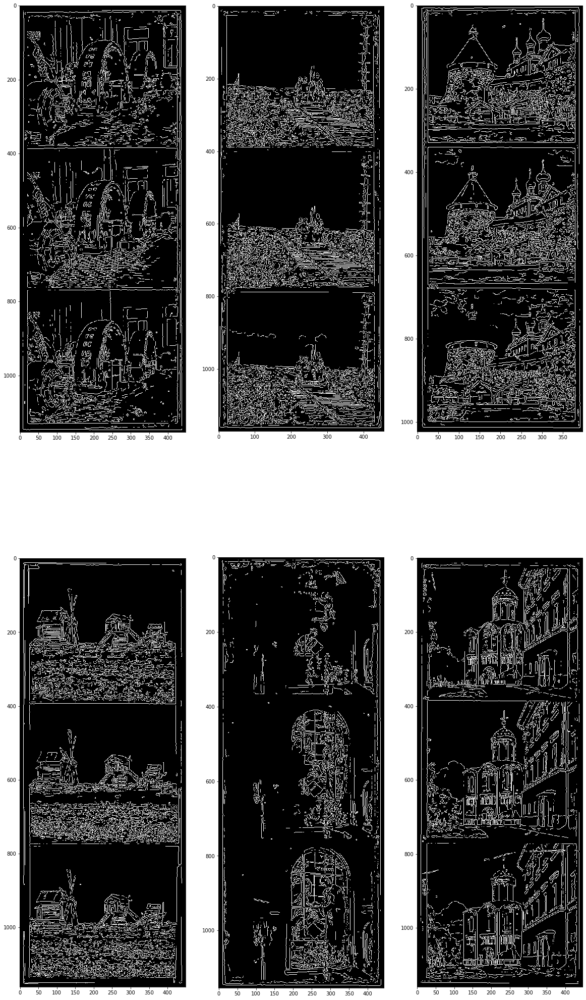

In [24]:
from  skimage.feature import canny


def Canny_detector(img):
    """ Your implementation instead of skimage """     
    return canny(img)


canny_imgs = []
for img in plates:
    canny_img = canny(img)
    canny_imgs.append(canny_img)
    
visualize(canny_imgs, 'gray')

This takes time, please wait...
Running on image 1...
Gaussian blurring running...
Finding gradient running...
Non maximum suppression running...
Double thresholding running...
Hysteresis running...
Running on image 2...
Gaussian blurring running...
Finding gradient running...
Non maximum suppression running...
Double thresholding running...
Hysteresis running...
Running on image 3...
Gaussian blurring running...
Finding gradient running...
Non maximum suppression running...
Double thresholding running...
Hysteresis running...
Running on image 4...
Gaussian blurring running...
Finding gradient running...
Non maximum suppression running...
Double thresholding running...
Hysteresis running...
Running on image 5...
Gaussian blurring running...
Finding gradient running...
Non maximum suppression running...
Double thresholding running...
Hysteresis running...
Running on image 6...
Gaussian blurring running...
Finding gradient running...
Non maximum suppression running...
Double thresholding

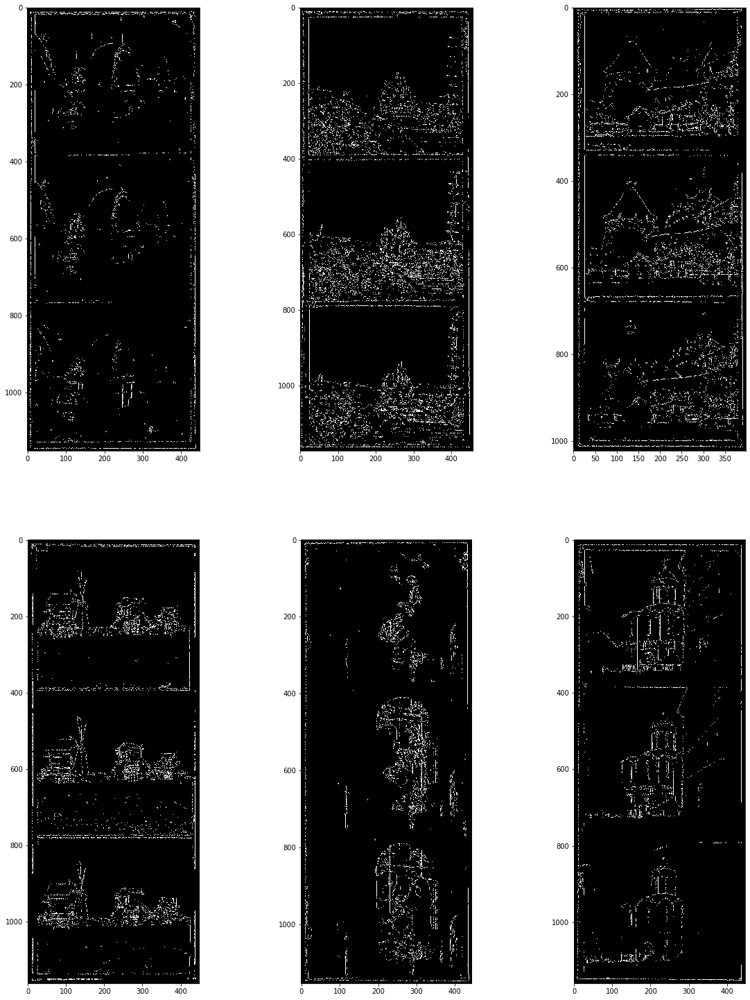

In [19]:
#################################################################
# TODO: implement Canny detector yourself.                      #
#       You can use methods from scipy.ndimage if you need.     #
#################################################################
from scipy import ndimage
from  skimage.feature import canny

#0=no edge, 1=soft pixel, 2= unprocessed hard edge pixel, 3=already processed
def mark_edge(img,x,y,freq):
#     print(x,y)
    if img[x][y]==2:
        img[x][y]=3
        freq[x][y]+=1
        for dx in [-1,0,1]:
            for dy in [-1,0,1]:
                if dx==0 and dy==0:
                    continue
                if x+dx>=img.shape[0] or y+dy>=img.shape[1] or x+dx<0 or y+dy<0:
                    continue  
                if img[x+dx][y+dx]==1:
                    img[x+dx][y+dx]=2
                    img = mark_edge(img,x+dx,y+dy,freq)
    return img

def Canny_detector(img):
    """ Your implementation instead of skimage """     
    #Gaussian Blurring
    print("Gaussian blurring running...")
    canny_img = ndimage.gaussian_filter(img, sigma=1.4)
    
    #Finding gradient
    print("Finding gradient running...")
    K_x = np.array([[-1.0,0,1],[-2,0,2],[-1,0,1]])
    K_y = np.array([[1.0,2,1],[0,0,0],[-1,-2,-1]])
    
    I_x = ndimage.convolve(img.astype(float32),K_x)
    I_y = ndimage.convolve(img.astype(float32),K_y)

#     I_y = ndimage.sobel(img,axis=1,mode='constant')
    
    mag = np.hypot(I_x,I_y)
    theta = np.arctan2(I_y,(I_x+0.0000001))
#     print(canny_img.shape,mag.shape,theta.shape,mag.dtype)
#     print(K_x.dtype, I_x.dtype, mag.dtype)
#     print(np.max(theta),np.min(theta))
#     print(np.max(I_x),np.min(I_x))
#     print(np.max(I_y),np.min(I_y))
    
    print("Non maximum suppression running...")
    piby8 = 3.1415926/6
    x_max, y_max = canny_img.shape
    canny_img[0,:] = 0
    canny_img[:,0] = 0
    canny_img[x_max-1,:] = 0
    canny_img[:,y_max-1] = 0
    for x in range(1,x_max-1):
        if (x*y_max)%4000==0:
#             print(str(int(x*100.0/x_max))+"%")
            pass
        for y in range(1,y_max-1):
            if theta[x][y]<piby8 and theta[x][y]>(-piby8):
                x_n1, y_n1 = (x+1, y)
                x_n2, y_n2 = (x-1, y)
            elif theta[x][y]>piby8 and theta[x][y]<(3*piby8):
                x_n1, y_n1 = (x+1, y+1)
                x_n2, y_n2 = (x-1, y-1)
            elif theta[x][y]>3*piby8 and theta[x][y]<(5*piby8):
                x_n1, y_n1 = (x, y+1)
                x_n2, y_n2 = (x, y-1)
            elif theta[x][y]>5*piby8 and theta[x][y]<(7*piby8):
                x_n1, y_n1 = (x-1, y+1)
                x_n2, y_n2 = (x+1, y-1)
            elif theta[x][y]>7*piby8 or theta[x][y]<(-7*piby8):
                x_n1, y_n1 = (x-1, y)
                x_n2, y_n2 = (x+1, y)
            elif theta[x][y]>(-3*piby8) and theta[x][y]<(-piby8):
                x_n1, y_n1 = (x+1, y-1)
                x_n2, y_n2 = (x-1, y+1)
            elif theta[x][y]>(-5*piby8) and theta[x][y]<(-3*piby8):
                x_n1, y_n1 = (x, y-1)
                x_n2, y_n2 = (x, y+1)
            elif theta[x][y]>(-7*piby8) and theta[x][y]<(-5*piby8):
                x_n1, y_n1 = (x-1, y-1)
                x_n2, y_n2 = (x+1, y+1)
            if mag[x][y]<mag[x_n1][y_n1] or mag[x][y]<mag[x_n2][y_n2]:
                mag[x][y] = 0
            
    
    #Double threshold
    print("Double thresholding running...")
#     print(np.max(mag),np.min(mag),np.mean(mag))
    mag = mag/np.max(mag)
    th_h = 0.25
    th_l = 0.05
    canny_img[mag<th_l] = 0
    canny_img[mag>=th_h] = 2
    canny_img[(mag>=th_l)*(mag<th_h)] = 1
#     print(np.max(canny_img),np.min(canny_img),np.mean(canny_img),canny_img.dtype)
    
    print("Hysteresis running...")
    freq=np.zeros(canny_img.shape)
    for x in range(1,x_max-1):
        if (x*y_max)%4000==0:
#             print(str(int(x*100.0/x_max))+"%")
            pass
        for y in range(1,y_max-1):
            if canny_img[x][y]==2:
                canny_img = mark_edge(canny_img,x,y,freq)     
    canny_img[canny_img==1] = 0
    canny_img[canny_img>0] = 255
#     print(np.max(freq))
    
    #     return canny(img,sigma=2)
    
    return canny_img
#     return (mag*255).astype(np.uint8)


canny_imgs = []
print("This takes time, please wait...")
count=0
for img in plates:
    count+=1
    print("Running on image "+str(count)+"...")
    canny_img = Canny_detector(img)
    canny_imgs.append(canny_img)
#     break
    
visualize(canny_imgs, 'gray')

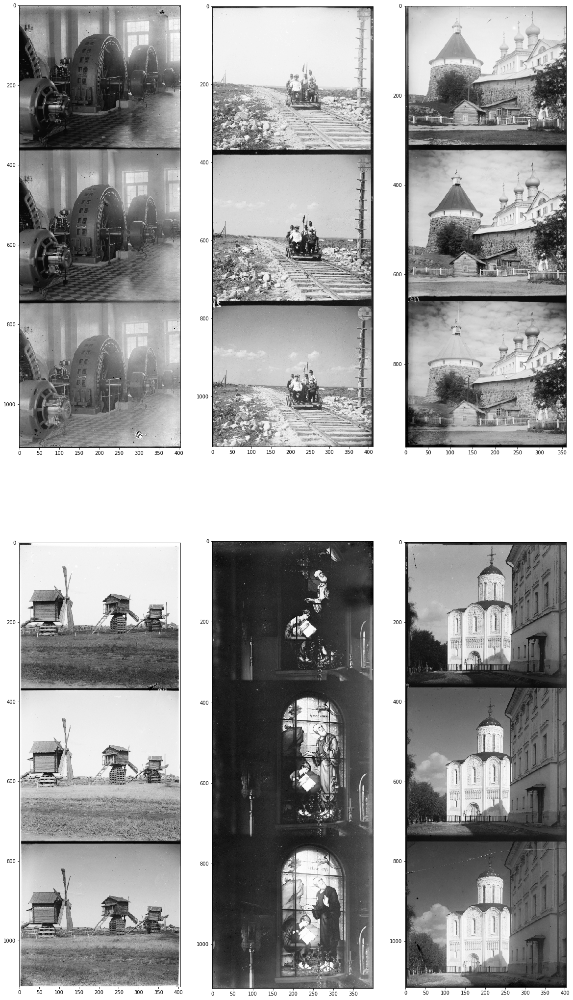

In [25]:
#################################################################
# TODO: Implement the removal of the tape borders using         #
#       the output of Canny edge detector ("canny_img" list)    #
#################################################################

def remove_borders(img, canny_img):
    """ Your implementation instead of the following one"""   
    dx = int(img.shape[1] * 0.05) 
    return img[dx : -dx, dx : -dx]


cropped_imgs = []
#crop borders
for i, img in enumerate(plates):
    cropped_imgs.append(remove_borders(img, canny_imgs[i]))

visualize(cropped_imgs, 'gray')

Upper, Lower, Left, Right (Border Crop Pixels)
0
13 36 10 31
1
12 34 24 31
2
12 28 26 29
3
17 19 13 32
4
8 36 12 32
5
13 32 12 34


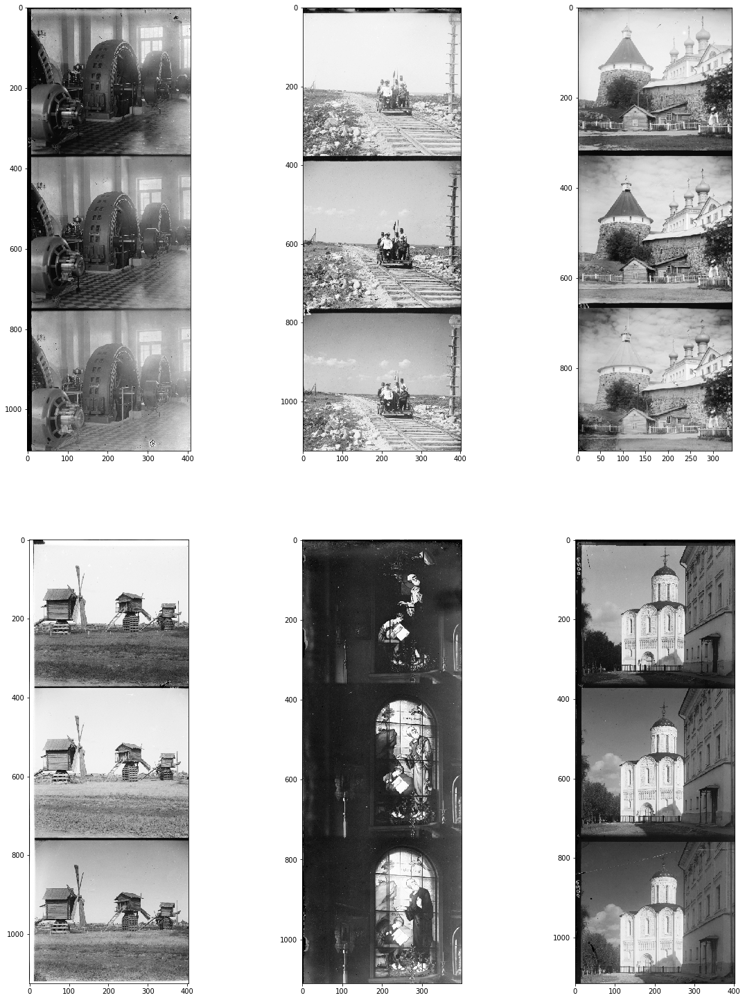

In [22]:
#################################################################
# TODO: Implement the removal of the tape borders using         #
#       the output of Canny edge detector ("canny_img" list)    #
#################################################################

#align=0 is horizontal, align=1 is vertical border
#f_or_l=0 for up and left, =1 for down and right
def find_border(patch, align, f_or_l):
    loc=1
    thresh=0.8
    x_dim,y_dim = patch.shape
#     print(patch.shape)
    if align==0:
        tmp = np.copy(patch)
        tmp[tmp>128] = 1
        count = np.sum(tmp,axis=1)
#         print(count)
#         print(count.shape,tmp.shape,count.max(),count.argmax())
        count=count.astype(int32)
        count[count>thresh*count.max()]=-1
#         print(count)
                
        for i in range(count.shape[0]):
            if count[i]==-1:
                loc=i
                if f_or_l==1:
                    break
#         print(loc)
    elif align==1:
        tmp = np.copy(patch)
        tmp[tmp>128] = 1
        count = np.sum(tmp,axis=0)
#         print(count.max(),count.argmax())
        count=count.astype(int32)
        count[count>thresh*count.max()]=-1
#         print(count)
        for i in range(count.shape[0]):
            if count[i]==-1:
                loc=i
                if f_or_l==1:
                    break
#         print(loc)
    return max(loc,1)   


def remove_borders(img, canny_img):
    """ Your implementation instead of the following one"""   
    rows,cols = canny_img.shape
    width = int(0.1*min(rows,cols))
#     print(canny_img.shape)
    d_up = find_border(canny_img[:width,:],0,0)
    
    d_down = find_border(canny_img[-width:,:],0,1)
    
    d_l = find_border(canny_img[:,:width],1,0)
    
    d_r = find_border(canny_img[:,-width:],1,1)
    
    print(d_up,d_down,d_l,d_r)
    return img[d_up : -d_down, d_l : -d_r]


cropped_imgs = []
#crop borders
print("Upper, Lower, Left, Right (Border Crop Pixels)")
for i, img in enumerate(plates):
    print(i)
    cropped_imgs.append(remove_borders(img, canny_imgs[i]))
#     break

visualize(cropped_imgs, 'gray')

In [28]:
for cropped_img in cropped_imgs:
    print(cropped_img.shape)
    print(len(cropped_img))
#     rgb_img = impose_components(cropped_img)
#     rgb_imgs.append(rgb_img)


(1104, 407)
1104
(1127, 402)
1127
(984, 343)
984
(1125, 404)
1125
(1110, 400)
1110
(1115, 402)
1115


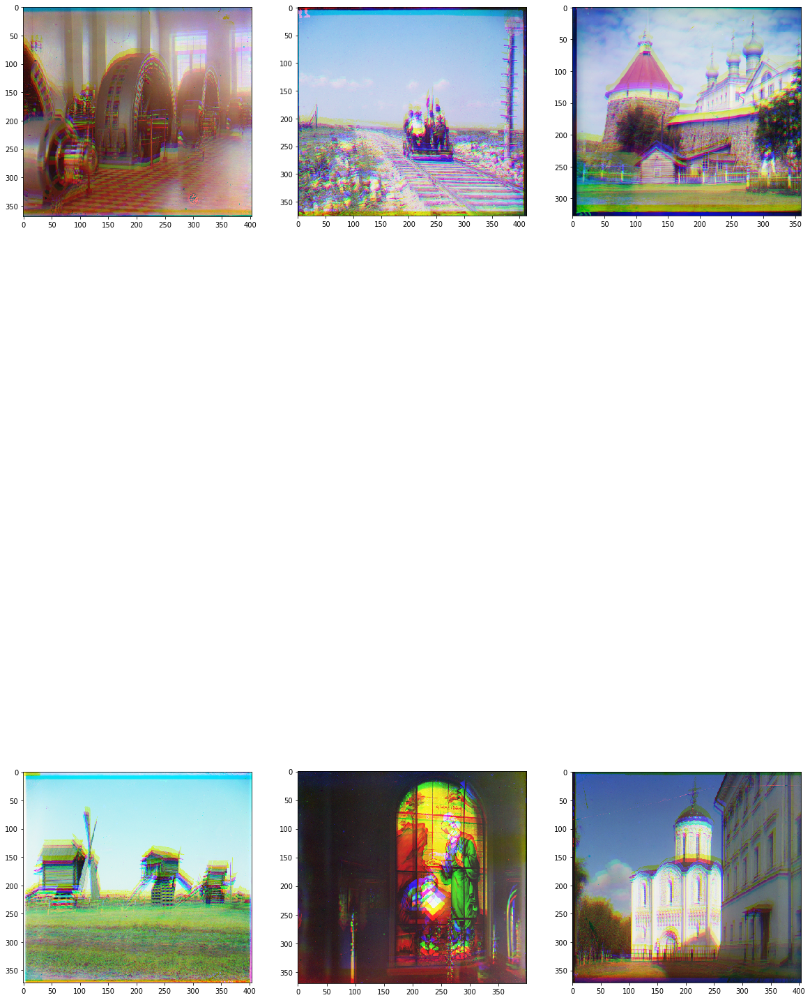

In [32]:
#################################################################
# TODO: implement the function impose_components transforming   #
#       cropped black-and-white images cropped_imgs             #
#       into the list of RGB images rgb_imgs                    #
#################################################################
def impose_components(img):
    height = img.shape[0] // 3
    merged = np.zeros((height, img.shape[1], 3), dtype=np.int32)
    merged[..., 0] = img[-height:, :] # R
    merged[..., 1] = img[height: height*2, :] # G
    merged[..., 2] = img[0:height, :] # B
    return merged
#     rows=len(img)
# #     print(rows/3)
#     imposed_image = []
#     imposed_image.append(np.array(img[2*(int(rows/3)):3*(int(rows/3)),:]))
#     imposed_image.append(np.array(img[(int(rows/3)):2*(int(rows/3)),:]))
#     imposed_image.append(np.array(img[0:(int(rows/3)),:]))
#     print(imposed_image[0].shape)
#     print(imposed_image[1].shape)
#     print(imposed_image[2].shape)
#     imposed_image = np.asarray(imposed_image)
#     print(len(imposed_image))
#     return imposed_image


rgb_imgs = []
for cropped_img in cropped_imgs:
    rgb_img = impose_components(cropped_img)
#     print(rgb_img.shape)
    rgb_imgs.append(rgb_img)

visualize(rgb_imgs)

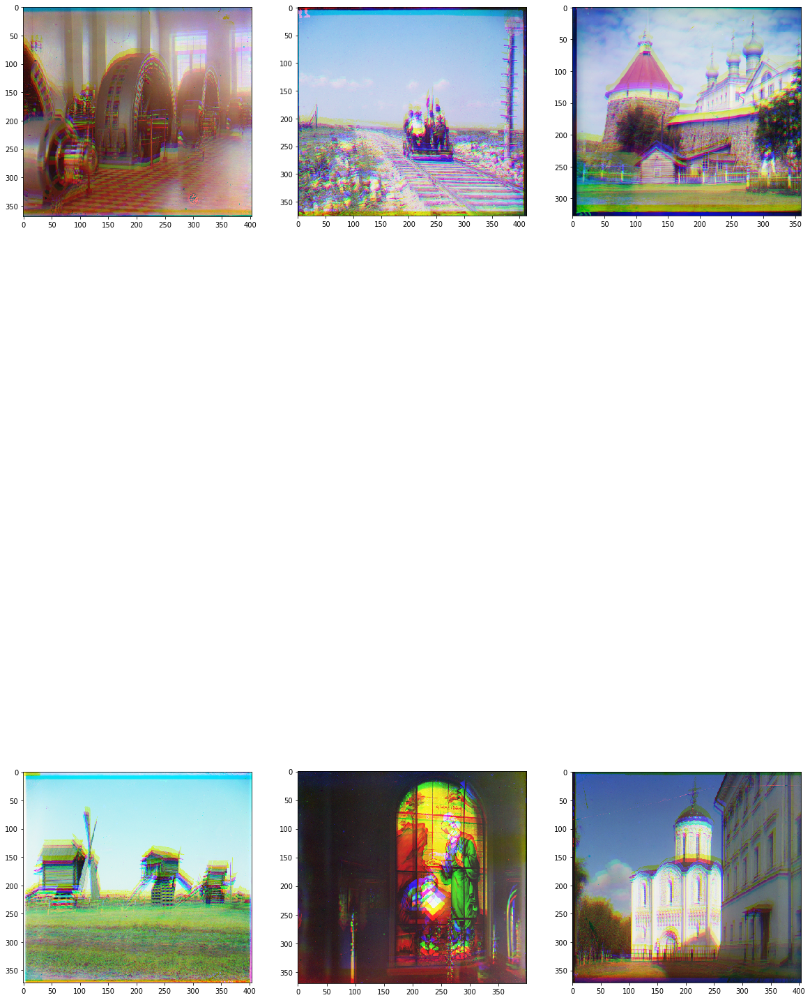

In [36]:
#################################################################
# TODO: implement the function impose_components transforming   #
#       cropped black-and-white images cropped_imgs             #
#       into the list of RGB images rgb_imgs                    #
#################################################################
def impose_components(img):
    height = img.shape[0] // 3
    merged = np.zeros((height, img.shape[1], 3), dtype=np.int32)
    merged[..., 0] = img[-height:, :] # R
    merged[..., 1] = img[height: height*2, :] # G
    merged[..., 2] = img[0:height, :] # B
    return merged
#     rows=len(img)
# #     print(rows/3)
#     imposed_image = []
#     imposed_image.append(np.array(img[0:(int(rows/3)),:]))
#     imposed_image.append(np.array(img[(int(rows/3)):2*(int(rows/3)),:]))

#     imposed_image.append(np.array(img[2*(int(rows/3)):3*(int(rows/3)),:]))
# #     print(imposed_image[0].shape)
# #     print(imposed_image[1].shape)
# #     print(imposed_image[2].shape)
#     imposed_image = np.asarray(imposed_image)
#     return imposed_image


rgb_imgs = []
for cropped_img in cropped_imgs:
    rgb_img = impose_components(cropped_img)
#     print(rgb_img.shape)
    rgb_imgs.append(rgb_img)

visualize(rgb_imgs)

In [39]:
import numpy as np
import skimage

In [40]:
#################################################################
# TODO: implement the functions mse и cor calculating           #
#       mean squared error and normalized cross-correlation     #
#       for two input images, respectively (1 point)            #
#################################################################
def mse(X, Y):
    """ Your implementation """     
    return np.mean((X - Y)**2)

def cor(X, Y):
    """ Your implementation """     
    return np.sum(X*Y) / (np.sum(X)*np.sum(Y))

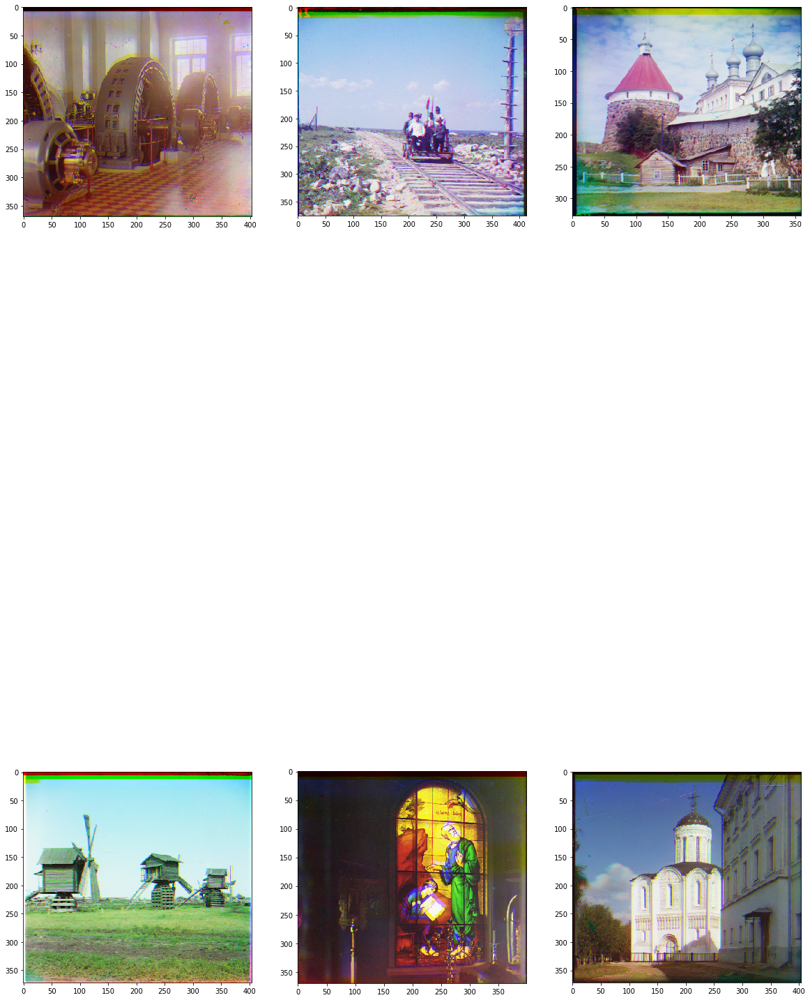

In [41]:
#################################################################
# TODO: implement the algorithm to find the best channel        #
#       shift and the alignment. Apply this algorithm for       #
#       rgb_imgs processing and get the final list of colored   #
#       pictures. These images will be used for the evaluation  #
#       of the quality of the whole algorithm.  (2 points)      #
#                                                               #
#       You can use the following interface or write your own.  #
#################################################################

#shift channel 2, keep channel 1 same
def get_best_shift(channel1, channel2, metric):
    """ Your implementation """
    candidates = [(dy, metric(channel1, ndimage.shift(channel2, shift=[dy, 0]))) for dy in range(-15, 16)]
    best_shift = sorted(candidates, key=lambda x: x[1])[0][0]
    return best_shift


def get_best_image(rgb_img, metric):
    """ Your implementation """     
    final_img = np.zeros(rgb_img.shape, dtype=np.int32)
    final_img[..., 0] = rgb_img[..., 0]
    shift1 = get_best_shift(rgb_img[..., 0], rgb_img[..., 1], metric)
    final_img[..., 1] = ndimage.shift(rgb_img[..., 1], shift=[shift1, 0])
    shift2 = get_best_shift(rgb_img[..., 0], rgb_img[..., 2], metric)
    final_img[..., 2] = ndimage.shift(rgb_img[..., 2], shift=[shift2, 0])
    return final_img




final_imgs = []
for img in rgb_imgs:
    final_img = get_best_image(img, mse)
    final_imgs.append(final_img)

visualize(final_imgs)